In [22]:
from kaggle_environments import make
import yaml
from IPython.display import HTML
from src.wrapper import DifficultyWrapper

with open('config.yaml') as file:
    config = yaml.safe_load(file)

def play_game(right_team): 
    env = make("football", debug=True,
               configuration={"save_video": True, 
                              "scenario_name": "11_vs_11_kaggle", 
                              "running_in_notebook": True})
    
    # env = DifficultyWrapper(env, initial_difficulty=1.0)
    output = env.run([right_team, "builtin_ai"])
    scores = output[-1][0]["observation"]["players_raw"][0]["score"]
    print("Scores  {0} : {1}".format(*scores))
    return output, scores, env

In [23]:
kutopon_output, kutopon_scores, env = play_game(config["kutopon"])
memory_output, memory_scores, env = play_game(config["memory"])
beast1_output, beast1_scores, env = play_game(config["beast1"])
beast2_output, beast2_scores, env = play_game(config["beast2"])

Staring a new environment 47dd2867-08da-4a63-b39c-b934a9aee183: with scenario: 11_vs_11_kaggle
Resetting environment 47dd2867-08da-4a63-b39c-b934a9aee183: with scenario: 11_vs_11_kaggle
Received video link.
Scores  3 : 1


In [ ]:
!pip install torch

     |############################### | 776.7 MB 9.6 MB/s eta 0:00:011  |                                | 6.0 MB 6.8 MB/s eta 0:01:54     |#                               | 42.4 MB 11.9 MB/s eta 0:01:02     |####                            | 118.4 MB 12.1 MB/s eta 0:00:55     |#######                         | 192.7 MB 10.4 MB/s eta 0:00:57     |############                    | 296.8 MB 7.6 MB/s eta 0:01:03     |############                    | 297.3 MB 10.7 MB/s eta 0:00:46     |#############                   | 319.1 MB 11.8 MB/s eta 0:00:39     |################                | 404.1 MB 9.4 MB/s eta 0:00:40     |################                | 404.6 MB 9.4 MB/s eta 0:00:40     |################                | 408.9 MB 11.7 MB/s eta 0:00:32     |###################             | 465.5 MB 7.5 MB/s eta 0:00:42     |######################          | 539.1 MB 9.2 MB/s eta 0:00:26     |######################          | 549.5 MB 12.5 MB/s eta 0:00:19     |######################    

In [1]:
import torch
# memory_output, memory_scores, env = play_game(config["memory"])
beast1_output, beast1_scores, env = play_game(config["beast1"])
# beast2_output, beast2_scores, env = play_game(config["beast2"])

ModuleNotFoundError: No module named 'torch'

In [24]:
env.render(mode="human", width=800, height=600)

In [30]:
from src.visualizer import visualize
viz = visualize(kutopon_output)
HTML(viz.to_html5_video())

KeyError: 19

<Figure size 864x476 with 0 Axes>

## outputから行動のlogをとる

In [3]:
len(output)

3002

In [4]:
actions_log = []
for i in range(1,3001,1):
    actions_log.append(output[i][0]["action"][0])

In [6]:
actions_dict = {
    0:"idle",
    1:"left",
    2:"top_left",
    3:"top",
    4:"top_right",
    5:"right",
    6:"bottom_right",
    7:"bottom",
    8:"bottom_left",
    9:"long_pass",
    10:"high_pass",
    11:"short_pass",
    12:"shot",
    13:"sprint",
    14:"release_direction",
    15:"release_sprint",
    16:"sliding",
    17:"dribble",
    18:"release_dribble",    
}

actions_dict_inverse = {v: k for k, v in actions_dict.items()}
actions_name = list(actions_dict.values())

In [8]:
import collections

def action_counter(actions_log:list):
    actions_count = dict(collections.Counter(actions_log))
    
    # zero padding unselected action-options
    for i in list(actions_dict.keys()):
        if i in actions_count.keys():
            pass
        else:
            actions_count[i] = 0
    actions_count = sorted(actions_count.items(), key=lambda x:x[0])
    
    # convert key name(number(int) -> action_name(str))
    converted_actions_count = {}
    for key, count in actions_count:
        converted_key = actions_dict[key]
        converted_actions_count[converted_key] = count

    return converted_actions_count

actions_count = action_counter(actions_log)
print(actions_count)

{'idle': 231, 'left': 111, 'top_left': 80, 'top': 83, 'top_right': 189, 'right': 344, 'bottom_right': 218, 'bottom': 64, 'bottom_left': 76, 'long_pass': 208, 'high_pass': 111, 'short_pass': 161, 'shot': 125, 'sprint': 384, 'release_direction': 77, 'release_sprint': 171, 'sliding': 78, 'dribble': 10, 'release_dribble': 279}


In [9]:
import pandas as pd

# action_df = pd.DataFrame(init_value, index=actions_name, columns=["count"])
action_df = pd.DataFrame()
action_df["action"] = list(actions_count.keys())
action_df["count"] = list(actions_count.values())
action_df

,action,count
0,idle,231
1,left,111
2,top_left,80
3,top,83
4,top_right,189
5,right,344
6,bottom_right,218
7,bottom,64
8,bottom_left,76
9,long_pass,208


In [10]:
import matplotlib.pyplot as plt
import seaborn as sns
def plot_action_count(df):
    df = df.sort_values(by="count", ascending=False).copy()
    fig, ax = plt.subplots(figsize=(10, 10), tight_layout=True)
    # sns.set_palette("Blues_r", 19)
    sns.barplot(x="count", y="action", data=df)
    ax.set_title('count actions in a game', fontsize=15)
    ax.set_xlabel("Count", fontsize=15)
    ax.set_ylabel("Actions", fontsize=15)
    ax.tick_params(direction = "out", left=True, bottom=True)
    plt.tick_params(labelsize=15)
    plt.show()

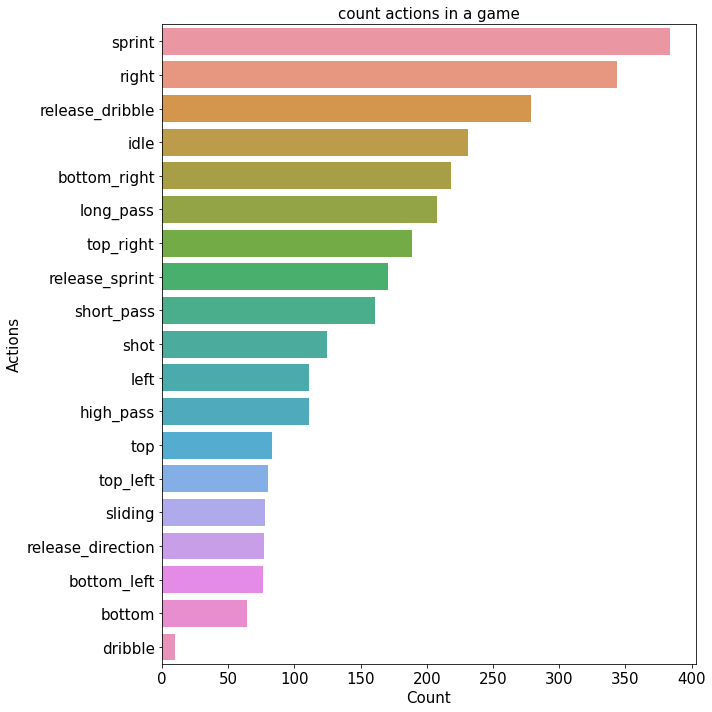

In [11]:
plot_action_count(action_df)

In [18]:
action_df

,action,count
0,idle,231
1,left,111
2,top_left,80
3,top,83
4,top_right,189
5,right,344
6,bottom_right,218
7,bottom,64
8,bottom_left,76
9,long_pass,208


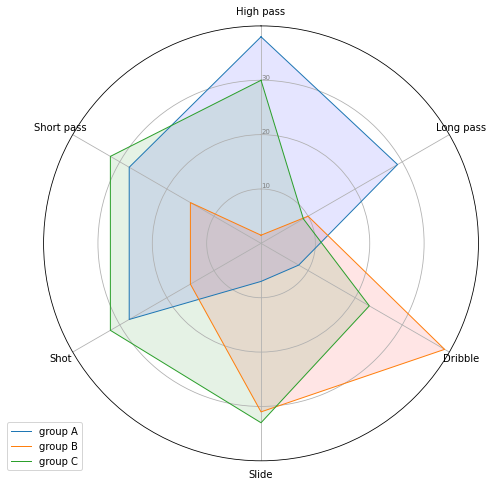

In [17]:
# Libraries
import matplotlib.pyplot as plt
import pandas as pd
from math import pi


# ------- PART 1: Create background
 
# number of variable
categories=list(df)[1:]
N = len(categories)
 
# What will be the angle of each axis in the plot? (we divide the plot / number of variable)
angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]
 
# Initialise the spider plot
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111, polar=True)
 
# If you want the first axis to be on top:
ax.set_theta_offset(pi / 2)
ax.set_theta_direction(-1)
 
# Draw one axe per variable + add labels labels yet
plt.xticks(angles[:-1], categories)
 
# Draw ylabels
ax.set_rlabel_position(0)
plt.yticks([10,20,30], ["10","20","30"], color="grey", size=7)
plt.ylim(0,40)
 
 
# ------- PART 2: Add plots
 
# Plot each individual = each line of the data
# I don't do a loop, because plotting more than 3 groups makes the chart unreadable
 
# Ind1
values=df.loc[0].drop('group').values.flatten().tolist()
values += values[:1]
ax.plot(angles, values, linewidth=1, linestyle='solid', label="group A")
ax.fill(angles, values, 'b', alpha=0.1)
 
# Ind2
values=df.loc[1].drop('group').values.flatten().tolist()
values += values[:1]
ax.plot(angles, values, linewidth=1, linestyle='solid', label="group B")
ax.fill(angles, values, 'r', alpha=0.1)

# Ind3
values=df.loc[2].drop('group').values.flatten().tolist()
values += values[:1]
ax.plot(angles, values, linewidth=1, linestyle='solid', label="group C")
ax.fill(angles, values, 'g', alpha=0.1)

# Add legend
plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))
